In [1]:
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt 
sb.set() 

Now we will take a look to see what are the optimal budget and runtime that will produce the most successful movie

In [2]:
success_data = pd.read_pickle('success.pkl')
success_data

,popularity,profit
0,32.985763,1.363529e+09
1,28.419936,2.284364e+08
2,13.112507,1.852382e+08
3,11.173104,1.868178e+09
4,9.335014,1.316249e+09
...,...,...
1282,1.549139,1.547778e+08
1283,1.910465,1.301957e+08
1284,1.778746,7.497449e+07
1285,1.198849,6.970000e+07


In [3]:
success_data.info()
popularity_data = success_data[['popularity']]
profit_data = success_data[['profit']]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1287 entries, 0 to 1286
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   popularity  1287 non-null   float64
 1   profit      1287 non-null   float64
dtypes: float64(2)
memory usage: 20.2 KB


In [4]:
popularity_data.describe()

,popularity
count,1287.000000
mean,1.786022
std,2.172137
min,0.010335
25%,0.664783
50%,1.152354
75%,2.125342
max,32.985763


In [5]:
profit_data.describe()

,profit
count,1.287000e+03
mean,1.242409e+08
std,2.183462e+08
min,-4.139124e+08
25%,3.142641e+06
50%,4.524300e+07
75%,1.470070e+08
max,2.544506e+09


In [6]:
factors = pd.read_pickle('factors.pkl')
factors

,budget,cast,director,genres,production_companies,release_year,release_date,runtime,month
0,150000000.0,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,Colin Trevorrow,Action|Adventure|Science Fiction|Thriller,Universal Studios|Amblin Entertainment|Legenda...,2015,2015-06-09,124,06
1,150000000.0,Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...,George Miller,Action|Adventure|Science Fiction|Thriller,Village Roadshow Pictures|Kennedy Miller Produ...,2015,2015-05-13,120,05
2,110000000.0,Shailene Woodley|Theo James|Kate Winslet|Ansel...,Robert Schwentke,Adventure|Science Fiction|Thriller,Summit Entertainment|Mandeville Films|Red Wago...,2015,2015-03-18,119,03
3,200000000.0,Harrison Ford|Mark Hamill|Carrie Fisher|Adam D...,J.J. Abrams,Action|Adventure|Science Fiction|Fantasy,Lucasfilm|Truenorth Productions|Bad Robot,2015,2015-12-15,136,12
4,190000000.0,Vin Diesel|Paul Walker|Jason Statham|Michelle ...,James Wan,Action|Crime|Thriller,Universal Pictures|Original Film|Media Rights ...,2015,2015-04-01,137,04
...,...,...,...,...,...,...,...,...,...
1282,7000000.0,Roger Moore|Yaphet Kotto|Jane Seymour|Clifton ...,Guy Hamilton,Adventure|Action|Thriller,Eon Productions|Metro-Goldwyn-Mayer (MGM),1973,1973-07-05,121,07
1283,11000000.0,Sean Connery|Claudine Auger|Adolfo Celi|Lucian...,Terence Young,Adventure|Action|Thriller,Eon Productions|Metro-Goldwyn-Mayer (MGM),1965,2065-12-16,130,12
1284,7000000.0,George Lazenby|Diana Rigg|Telly Savalas|Gabrie...,Peter R. Hunt,Adventure|Action|Thriller,Eon Productions|Metro-Goldwyn-Mayer (MGM)|Danjaq,1969,2069-12-12,142,12
1285,300000.0,Donald Pleasence|Jamie Lee Curtis|P.J. Soles|N...,John Carpenter,Horror|Thriller,Compass International Pictures|Falcon Internat...,1978,1978-10-25,91,10


In [7]:
budget = pd.DataFrame(factors['budget']).sort_values(by = "budget", ascending = False)
budget

,budget
404,425000000.0
537,380000000.0
1078,300000000.0
14,280000000.0
757,260000000.0
...,...
275,75.0
710,68.0
1268,30.0
412,3.0


In [8]:
runtime = pd.DataFrame(factors['runtime'])
runtime

,runtime
0,124
1,120
2,119
3,136
4,137
...,...
1282,121
1283,130
1284,142
1285,91


In [9]:
jointDF = pd.concat([budget, popularity_data], axis = 1)
jointDF

,budget,popularity
404,425000000.0,0.250540
537,380000000.0,4.955130
1078,300000000.0,4.965391
14,280000000.0,5.944927
757,260000000.0,1.588457
...,...,...
275,75.0,0.278387
710,68.0,0.958182
1268,30.0,1.072912
412,3.0,0.028456


<Axes: xlabel='budget', ylabel='popularity'>

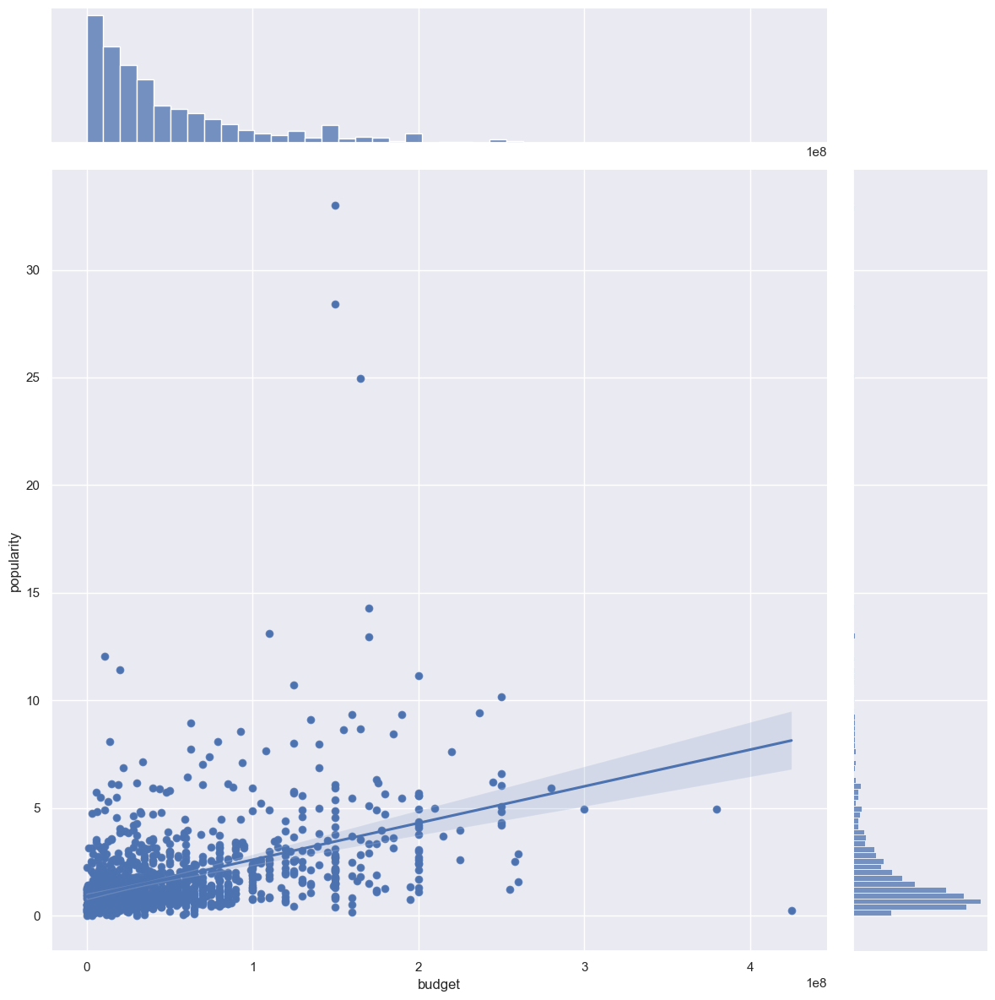

In [10]:
sb.jointplot(data = jointDF, x = "budget", y = "popularity", height = 12)
x, y = pd.Series(jointDF["budget"], name="budget").item, pd.Series(jointDF["popularity"], name="populairty").item
sb.regplot(x="budget", y="popularity", data=jointDF)


In [110]:
jointDF.corr()

,budget,popularity
budget,1.000000,0.432791
popularity,0.432791,1.000000


In [11]:
jointDF2 = pd.concat([budget, profit_data], axis = 1).reindex(budget.index)
jointDF2

,budget,profit
404,425000000.0,-4.139124e+08
537,380000000.0,6.416830e+08
1078,300000000.0,6.610000e+08
14,280000000.0,1.125036e+09
757,260000000.0,2.413910e+07
...,...,...
275,75.0,5.900000e+01
710,68.0,1.250000e+02
1268,30.0,1.700000e+02
412,3.0,4.000000e+01


<Axes: xlabel='budget', ylabel='profit'>

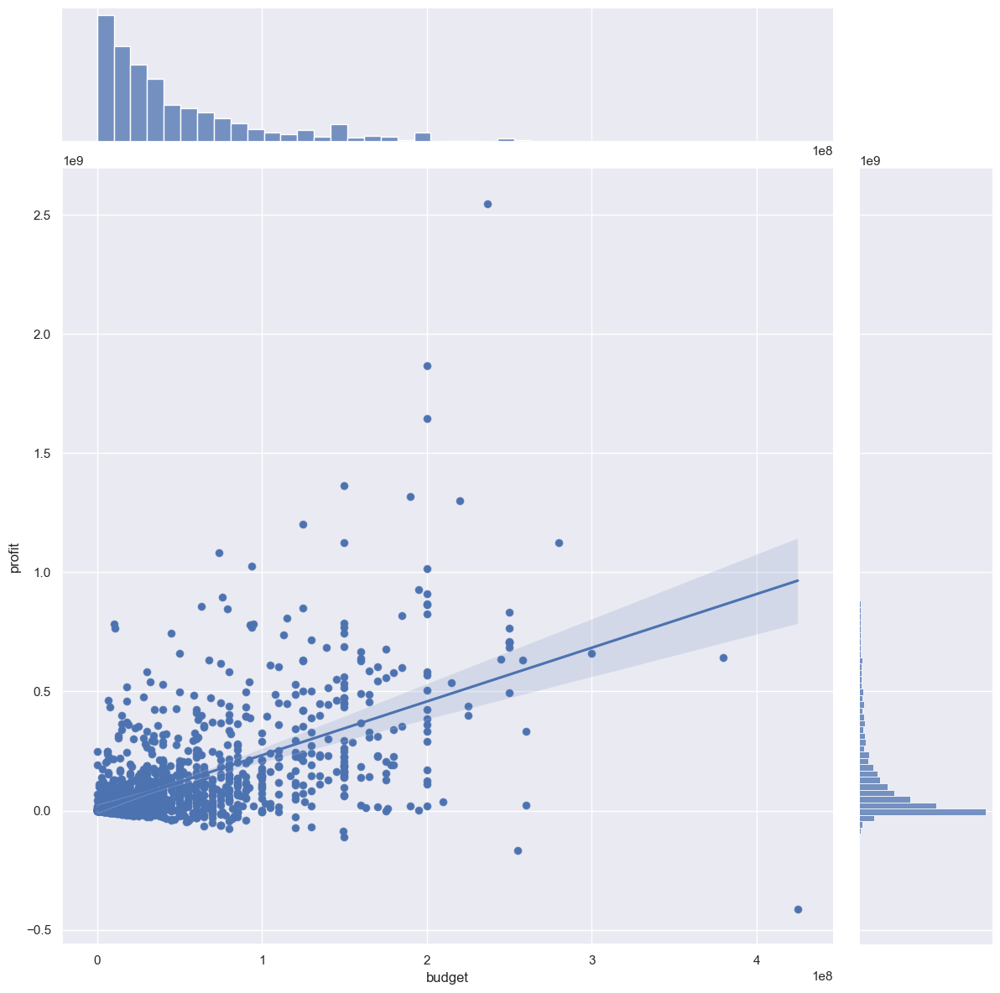

In [12]:
sb.jointplot(data = jointDF2, x = "budget", y = "profit", height = 12)
x, y = pd.Series(jointDF2["budget"], name="budget").item, pd.Series(jointDF2["profit"], name="profit").item
sb.regplot(x="budget", y="profit", data=jointDF2)

In [113]:
jointDF2.corr()

,budget,profit
budget,1.00000,0.56916
profit,0.56916,1.00000


In [13]:
jointDF3 = pd.concat([runtime, popularity_data], axis = 1).reindex(budget.index)
jointDF3

,runtime,popularity
404,100,0.250540
537,136,4.955130
1078,169,4.965391
14,141,5.944927
757,132,1.588457
...,...,...
275,129,0.278387
710,124,0.958182
1268,134,1.072912
412,87,0.028456


<Axes: xlabel='runtime', ylabel='popularity'>

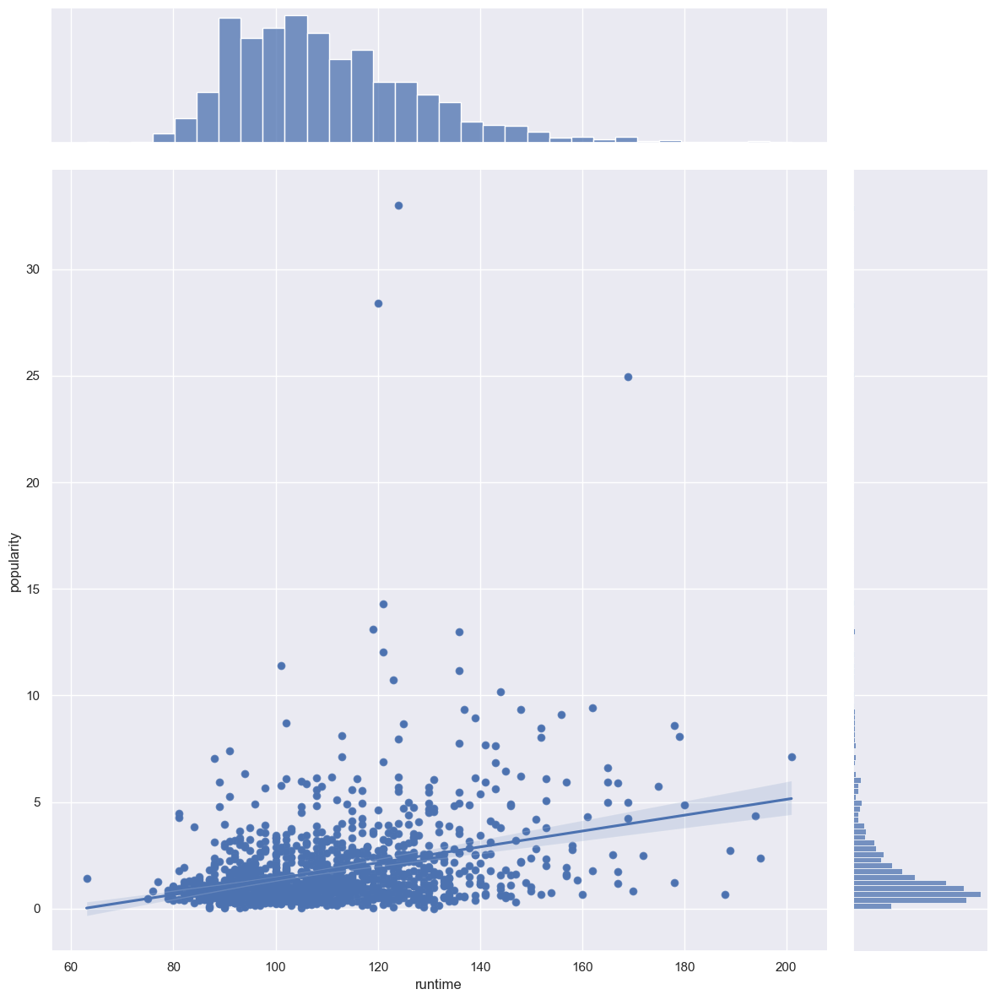

In [14]:
sb.jointplot(data = jointDF3, x = "runtime", y = "popularity", height = 12)
x, y = pd.Series(jointDF3["runtime"], name="budget").item, pd.Series(jointDF3["runtime"], name="populairty").item
sb.regplot(x="runtime", y="popularity", data=jointDF3)

In [15]:
jointDF3.corr()

,runtime,popularity
runtime,1.00000,0.32239
popularity,0.32239,1.00000


In [16]:
jointDF4 = pd.concat([runtime, profit_data], axis = 1).reindex(budget.index)
jointDF4

,runtime,profit
404,100,-4.139124e+08
537,136,6.416830e+08
1078,169,6.610000e+08
14,141,1.125036e+09
757,132,2.413910e+07
...,...,...
275,129,5.900000e+01
710,124,1.250000e+02
1268,134,1.700000e+02
412,87,4.000000e+01


<Axes: xlabel='runtime', ylabel='profit'>

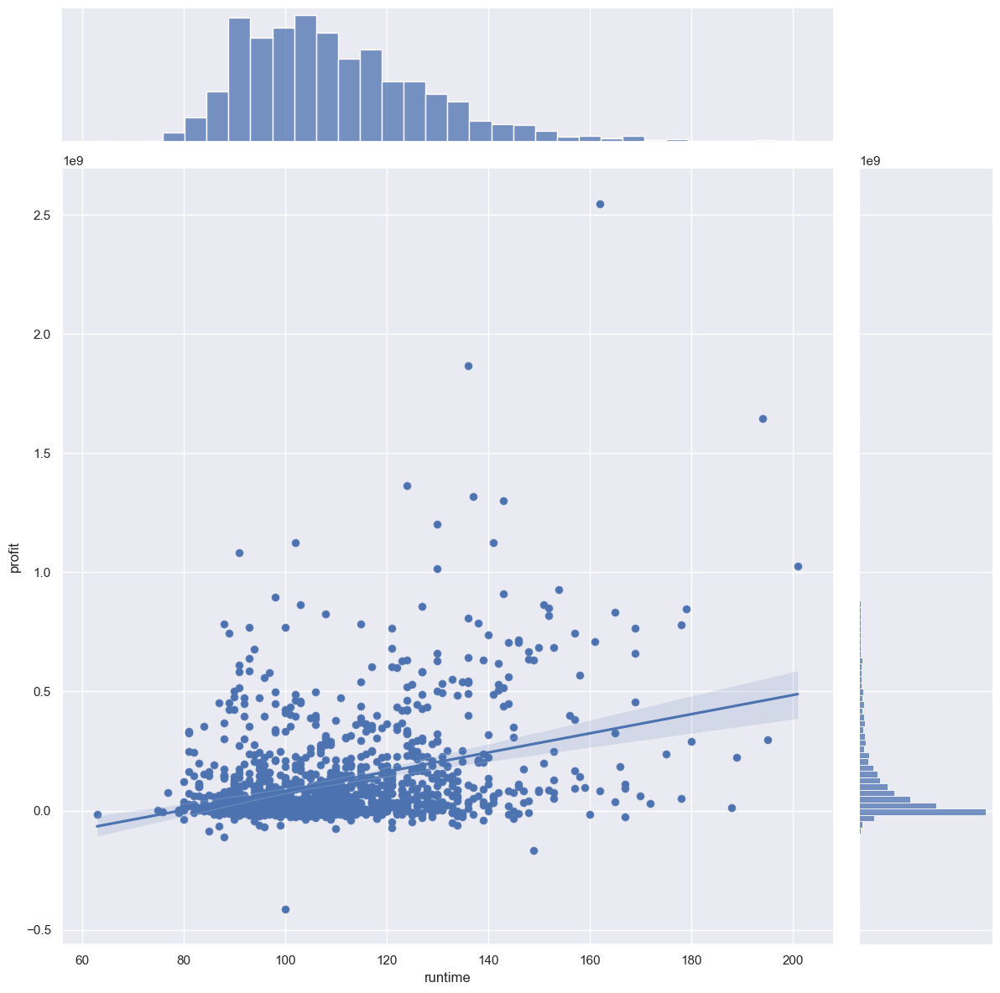

In [118]:
sb.jointplot(data = jointDF4, x = "runtime", y = "profit", height = 12)
x, y = pd.Series(jointDF4["runtime"], name="profit").item, pd.Series(jointDF4["runtime"], name="profit").item
sb.regplot(x="runtime", y="profit", data=jointDF4)

In [17]:
jointDF4.corr()

,runtime,profit
runtime,1.000000,0.346323
profit,0.346323,1.000000


In [18]:

import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import sklearn
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.tree import plot_tree
sb.set()

In [19]:
popularity_threshold = success_data[['popularity']].quantile(0.75)
success_data[['popular?']] = success_data[['popularity']] >= popularity_threshold
profit_threshold = success_data[['profit']].quantile(0.75)
success_data[['profitable?']] = success_data[['profit']] >= profit_threshold
success_data



,popularity,profit,popular?,profitable?
0,32.985763,1.363529e+09,True,True
1,28.419936,2.284364e+08,True,True
2,13.112507,1.852382e+08,True,True
3,11.173104,1.868178e+09,True,True
4,9.335014,1.316249e+09,True,True
...,...,...,...,...
1282,1.549139,1.547778e+08,False,True
1283,1.910465,1.301957e+08,False,False
1284,1.778746,7.497449e+07,False,False
1285,1.198849,6.970000e+07,False,False


In [20]:
jointDF5 = pd.concat([success_data, budget, runtime], axis = 1).reindex(budget.index)
jointDF5

,popularity,profit,popular?,profitable?,budget,runtime
404,0.250540,-4.139124e+08,False,False,425000000.0,100
537,4.955130,6.416830e+08,True,True,380000000.0,136
1078,4.965391,6.610000e+08,True,True,300000000.0,169
14,5.944927,1.125036e+09,True,True,280000000.0,141
757,1.588457,2.413910e+07,False,False,260000000.0,132
...,...,...,...,...,...,...
275,0.278387,5.900000e+01,False,False,75.0,129
710,0.958182,1.250000e+02,False,False,68.0,124
1268,1.072912,1.700000e+02,False,False,30.0,134
412,0.028456,4.000000e+01,False,False,3.0,87


In [31]:
budget = pd.DataFrame(jointDF5['budget'])
runtime = pd.DataFrame(jointDF5['runtime'])
popular = pd.DataFrame(jointDF5['popular?'])
profitable = pd.DataFrame(jointDF5['profitable?'])


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 5.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


<Axes: xlabel='budget', ylabel='popular?'>

c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 28.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


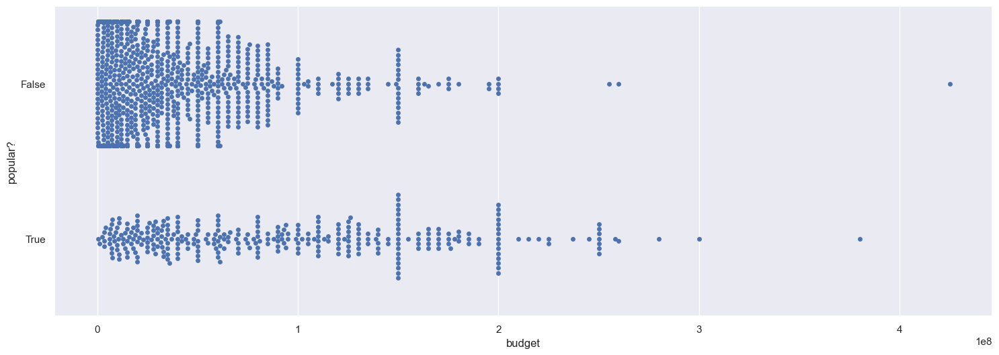

In [22]:
f = plt.figure(figsize=(18, 6))
sb.swarmplot(x = "budget", y = "popular?", data = jointDF5, orient = "h")

In [41]:
tree1 = DecisionTreeClassifier(max_depth= 4)    #* tree1 : max depth 4
tree1.fit(budget, popular)

f = plt.figure(figsize=(200,100))
plot_tree(tree1, filled=True, rounded=True, 
          feature_names=["budget"], 
          class_names=["No","Yes"])

[Text(0.5431034482758621, 0.9, 'budget <= 87500000.0\ngini = 0.375\nsamples = 1287\nvalue = [965, 322]\nclass = No'),
 Text(0.27586206896551724, 0.7, 'budget <= 30750000.0\ngini = 0.269\nsamples = 1050\nvalue = [882, 168]\nclass = No'),
 Text(0.13793103448275862, 0.5, 'budget <= 5500000.0\ngini = 0.209\nsamples = 632\nvalue = [557, 75]\nclass = No'),
 Text(0.06896551724137931, 0.3, 'budget <= 350000.0\ngini = 0.087\nsamples = 153\nvalue = [146, 7]\nclass = No'),
 Text(0.034482758620689655, 0.1, 'gini = 0.0\nsamples = 26\nvalue = [26, 0]\nclass = No'),
 Text(0.10344827586206896, 0.1, 'gini = 0.104\nsamples = 127\nvalue = [120, 7]\nclass = No'),
 Text(0.20689655172413793, 0.3, 'budget <= 29500000.0\ngini = 0.244\nsamples = 479\nvalue = [411, 68]\nclass = No'),
 Text(0.1724137931034483, 0.1, 'gini = 0.255\nsamples = 426\nvalue = [362, 64]\nclass = No'),
 Text(0.2413793103448276, 0.1, 'gini = 0.14\nsamples = 53\nvalue = [49, 4]\nclass = No'),
 Text(0.41379310344827586, 0.5, 'budget <= 3450

c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 7.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


<Axes: xlabel='budget', ylabel='profitable?'>

c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 31.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


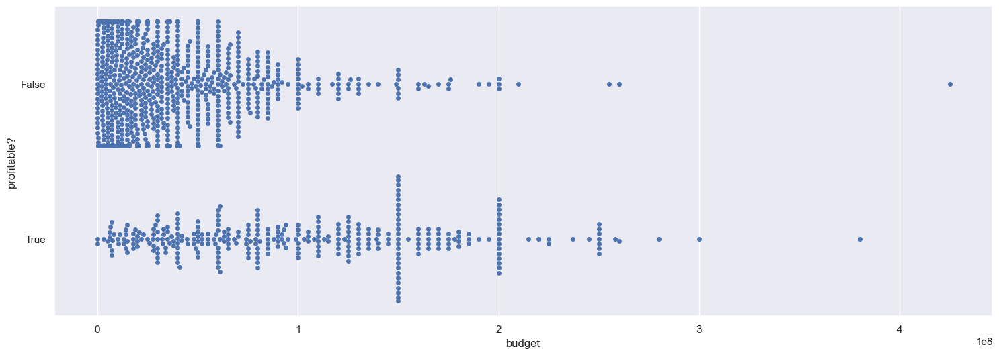

In [25]:
f = plt.figure(figsize=(18, 6))
sb.swarmplot(x = "budget", y = "profitable?", data = jointDF5, orient = "h")

In [55]:
tree1 = DecisionTreeClassifier(max_depth= 5)    #* tree1 : max depth 4
tree1.fit(budget, profitable)

f = plt.figure(figsize=(200,200))
plot_tree(tree1, filled=True, rounded=True, 
          feature_names=["budget"], 
          class_names=["No","Yes"])

[Text(0.5706521739130435, 0.9166666666666666, 'budget <= 91000000.0\ngini = 0.375\nsamples = 1287\nvalue = [965, 322]\nclass = No'),
 Text(0.33152173913043476, 0.75, 'budget <= 27250000.0\ngini = 0.255\nsamples = 1065\nvalue = [905, 160]\nclass = No'),
 Text(0.17391304347826086, 0.5833333333333334, 'budget <= 4900000.0\ngini = 0.123\nsamples = 560\nvalue = [523, 37]\nclass = No'),
 Text(0.08695652173913043, 0.4166666666666667, 'budget <= 26000.0\ngini = 0.044\nsamples = 134\nvalue = [131, 3]\nclass = No'),
 Text(0.043478260869565216, 0.25, 'budget <= 11500.0\ngini = 0.298\nsamples = 11\nvalue = [9, 2]\nclass = No'),
 Text(0.021739130434782608, 0.08333333333333333, 'gini = 0.0\nsamples = 8\nvalue = [8, 0]\nclass = No'),
 Text(0.06521739130434782, 0.08333333333333333, 'gini = 0.444\nsamples = 3\nvalue = [1, 2]\nclass = Yes'),
 Text(0.13043478260869565, 0.25, 'budget <= 2950000.0\ngini = 0.016\nsamples = 123\nvalue = [122, 1]\nclass = No'),
 Text(0.10869565217391304, 0.08333333333333333, 

<Axes: xlabel='runtime', ylabel='popular?'>

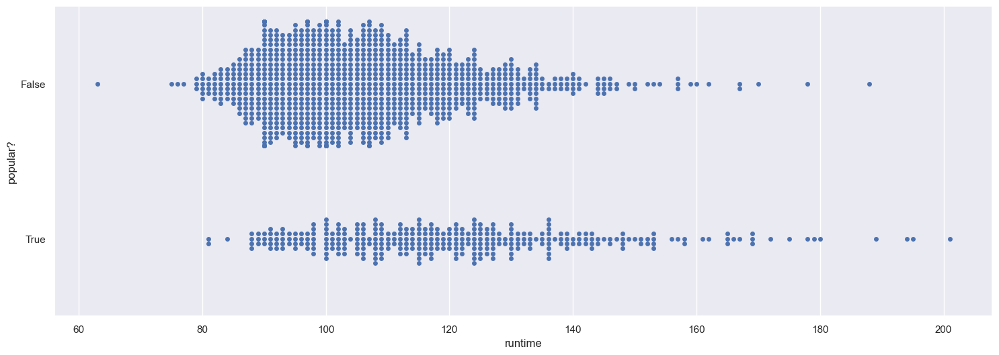

In [27]:
f = plt.figure(figsize=(18, 6))
sb.swarmplot(x = "runtime", y = "popular?", data = jointDF5, orient = "h")

[Text(0.5267857142857143, 0.9, 'runtime <= 114.5\ngini = 0.375\nsamples = 1287\nvalue = [965, 322]\nclass = No'),
 Text(0.2857142857142857, 0.7, 'runtime <= 99.5\ngini = 0.27\nsamples = 838\nvalue = [703, 135]\nclass = No'),
 Text(0.14285714285714285, 0.5, 'runtime <= 87.5\ngini = 0.207\nsamples = 409\nvalue = [361, 48]\nclass = No'),
 Text(0.07142857142857142, 0.3, 'runtime <= 81.5\ngini = 0.074\nsamples = 78\nvalue = [75, 3]\nclass = No'),
 Text(0.03571428571428571, 0.1, 'gini = 0.188\nsamples = 19\nvalue = [17, 2]\nclass = No'),
 Text(0.10714285714285714, 0.1, 'gini = 0.033\nsamples = 59\nvalue = [58, 1]\nclass = No'),
 Text(0.21428571428571427, 0.3, 'runtime <= 98.5\ngini = 0.235\nsamples = 331\nvalue = [286, 45]\nclass = No'),
 Text(0.17857142857142858, 0.1, 'gini = 0.252\nsamples = 305\nvalue = [260, 45]\nclass = No'),
 Text(0.25, 0.1, 'gini = 0.0\nsamples = 26\nvalue = [26, 0]\nclass = No'),
 Text(0.42857142857142855, 0.5, 'runtime <= 107.5\ngini = 0.323\nsamples = 429\nvalue = 

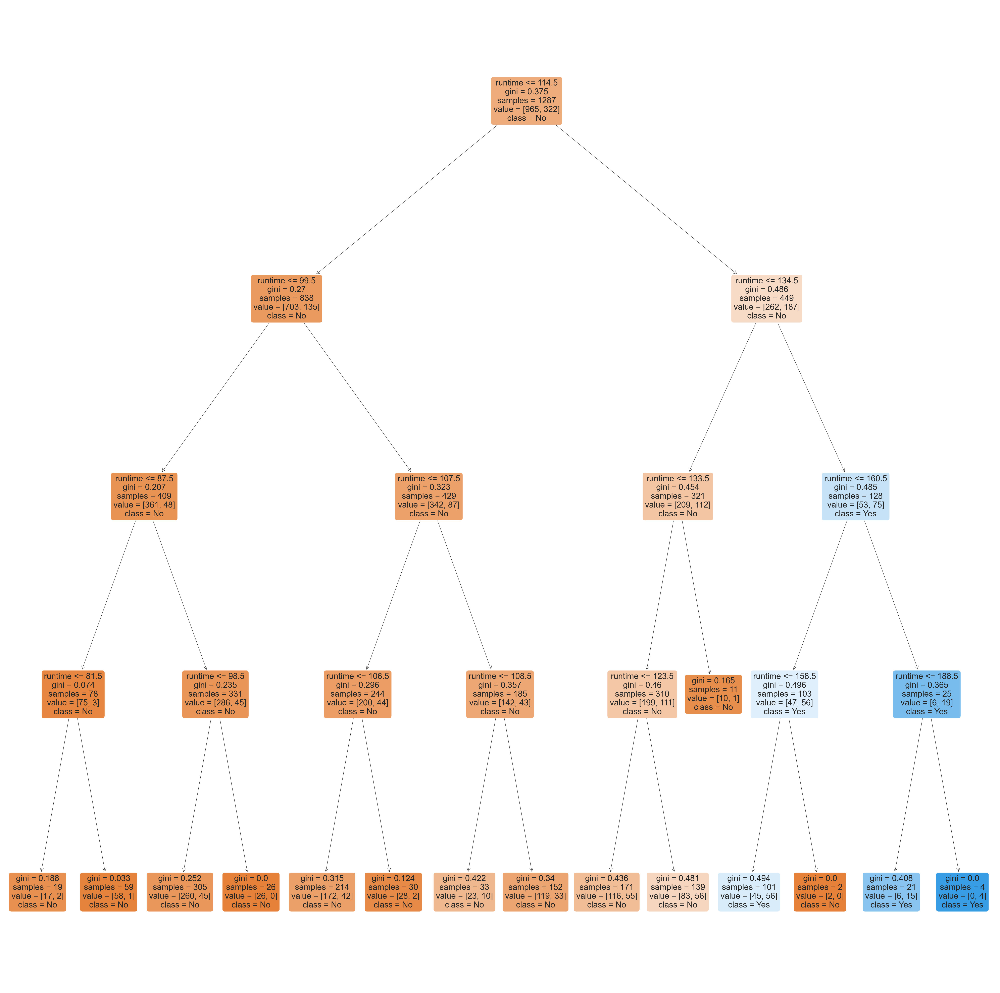

In [47]:
tree1 = DecisionTreeClassifier(max_depth= 4)    #* tree1 : max depth 4
tree1.fit(runtime, popular)

f = plt.figure(figsize=(64,64))
plot_tree(tree1, filled=True, rounded=True, 
          feature_names=["runtime"], 
          class_names=["No","Yes"])

<Axes: xlabel='runtime', ylabel='profitable?'>

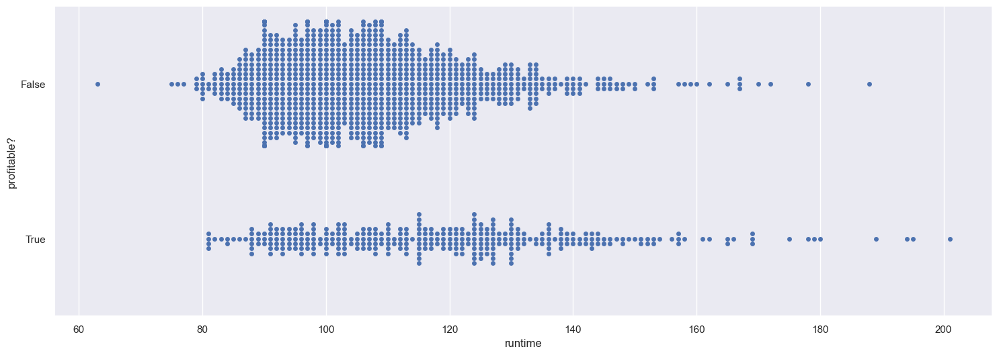

In [29]:
f = plt.figure(figsize=(18, 6))
sb.swarmplot(x = "runtime", y = "profitable?", data = jointDF5, orient = "h")

[Text(0.4659090909090909, 0.9, 'runtime <= 123.5\ngini = 0.375\nsamples = 1287\nvalue = [965, 322]\nclass = No'),
 Text(0.18181818181818182, 0.7, 'runtime <= 114.5\ngini = 0.304\nsamples = 1009\nvalue = [820, 189]\nclass = No'),
 Text(0.09090909090909091, 0.5, 'runtime <= 80.5\ngini = 0.278\nsamples = 838\nvalue = [698, 140]\nclass = No'),
 Text(0.045454545454545456, 0.3, 'gini = 0.0\nsamples = 13\nvalue = [13, 0]\nclass = No'),
 Text(0.13636363636363635, 0.3, 'runtime <= 81.5\ngini = 0.282\nsamples = 825\nvalue = [685, 140]\nclass = No'),
 Text(0.09090909090909091, 0.1, 'gini = 0.444\nsamples = 6\nvalue = [2, 4]\nclass = Yes'),
 Text(0.18181818181818182, 0.1, 'gini = 0.277\nsamples = 819\nvalue = [683, 136]\nclass = No'),
 Text(0.2727272727272727, 0.5, 'runtime <= 115.5\ngini = 0.409\nsamples = 171\nvalue = [122, 49]\nclass = No'),
 Text(0.22727272727272727, 0.3, 'gini = 0.483\nsamples = 27\nvalue = [16, 11]\nclass = No'),
 Text(0.3181818181818182, 0.3, 'runtime <= 120.5\ngini = 0.389

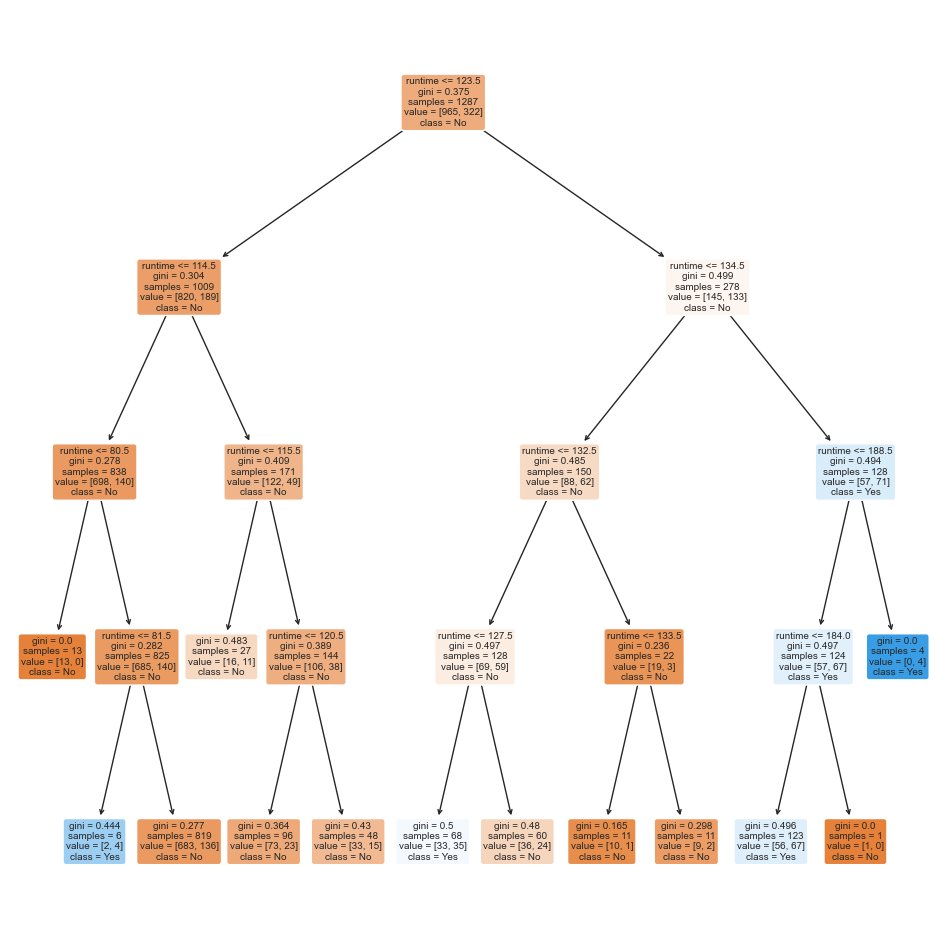

In [35]:
tree1 = DecisionTreeClassifier(max_depth= 4)    #* tree1 : max depth 4
tree1.fit(runtime, profitable)

f = plt.figure(figsize=(12,12))
plot_tree(tree1, filled=True, rounded=True, 
          feature_names=["runtime"], 
          class_names=["No","Yes"])